# Introduction

This notebook uses the larger dataset and so will not run in **binder**.


Let's compare ascent versus descent data as if they were roughly simultaneous. Since the upper 
water column is more dynamic we might expect more variability there. Let's find out. 

In [1]:
import os, sys, time, glob, warnings
from IPython.display import clear_output             # use inside loop with clear_output(wait = True) followed by print(i)
warnings.filterwarnings('ignore')
this_dir = os.getcwd()
data_dir = this_dir + '/../data'

from matplotlib import pyplot as plt
from matplotlib import colors as mplcolors
import numpy as np, pandas as pd, xarray as xr
from numpy import datetime64 as dt64, timedelta64 as td64

# convenience functions abbreviating 'datetime64' and so on
def doy(theDatetime): return 1 + int((theDatetime - dt64(str(theDatetime)[0:4] + '-01-01')) / td64(1, 'D'))
def dt64_from_doy(year, doy): return dt64(str(year) + '-01-01') + td64(doy-1, 'D')
def day_of_month_to_string(d): return str(d) if d > 9 else '0' + str(d)

print('\nJupyter Notebook running Python {}'.format(sys.version_info[0]))


Jupyter Notebook running Python 3


In [2]:
# Specific to the profile files: We have CSV files with columns corresponding to ascent start, etcetera.
# This function reads and assorts these time stamps. It keeps them in chronological order but there is
#   at the moment no further metadata; for example concerning time of day.

def ReadProfiles(fnm):
    """
    Profiles are saved by site and year as 12-tuples. Here we read only
    the datetimes (not the indices) so there are only six values. These
    are converted to Timestamps. They correspond to ascend start/end, 
    descend start/end and rest start/end.
    """
    df = pd.read_csv(fnm, usecols=["1", "3", "5", "7", "9", "11"])
    df.columns=['ascent_start', 'ascent_end', 'descent_start', 'descent_end', 'rest_start', 'rest_end']
    df['ascent_start']  = pd.to_datetime(df['ascent_start'])
    df['ascent_end']    = pd.to_datetime(df['ascent_end'])
    df['descent_start'] = pd.to_datetime(df['descent_start'])
    df['descent_end']   = pd.to_datetime(df['descent_end'])
    df['rest_start']    = pd.to_datetime(df['rest_start'])
    df['rest_end']      = pd.to_datetime(df['rest_end'])
    return df



In [3]:
# on-deck circle: un-comment to determine "ridiculous" name, give it a usable name 
# dsO = xr.open_dataset("/mnt/d/data/data_explorer_1Min/axb/profiler/axb_profiler_doxygen_1Min.nc")
# dsO = dsO.rename_vars({"moles_of_oxygen_per_unit_mass_in_sea_water_profiler_depth_enabled":"doxygen"})
# dsO

In [4]:
# Let's start with the first five months of 2018 at Axial Base

# Dictionary of single-letter sensor keys: Capital letter follows 'ds'
#
# Desig     Data                     Renamed                 Instrument
# -----     ----                     -------                 ----------
# A         Chlorophyll-A            chlora                  fluorometer
# B         backscatter              backscatter             fluorometer
# C         CDOM                     cdom                    fluorometer
# G         pCO2                     pco2                    ?
# H         pH                       ph                      pH
# I         Spectral Irradiance      ?                       spkir
# M         Reserved for Nitrate'    ?                       nitrate
# N         Nitrate                  ?                       nitrate
# P         PAR                      par                     PAR
# Q         pressure                 pressure                CTD
# O         dissolved oxygen         doxygen                 CTD
# T         temperature              temp                    CTD
# S         salinity                 salinity                CTD
#
# 
# Dictionary of interval designators: Capital letter follows sensor key
#
# A     Ascent
# D     Descent
# R     Rest

# Note these are profile times for Axial Base in 2018
df = ReadProfiles(os.getcwd()+"/profiles/axb2018.csv")

dsA = xr.open_dataset("/mnt/d/data/data_explorer_1Min/axb/profiler/axb_profiler_chlora_1Min.nc")
dsA = dsA.rename_vars({"mass_concentration_of_chlorophyll_a_in_sea_water_profiler_depth_enabled":"chlora"})
dsB = xr.open_dataset("/mnt/d/data/data_explorer_1Min/axb/profiler/axb_profiler_backscatter_1Min.nc")
dsB = dsB.rename_vars({"flubsct_profiler_depth_enabled":"backscatter"})
dsC = xr.open_dataset("/mnt/d/data/data_explorer_1Min/axb/profiler/axb_profiler_cdom_1Min.nc")
dsC = dsC.rename_vars({"cdomflo_profiler_depth_enabled":"cdom"})
dsO = xr.open_dataset("/mnt/d/data/data_explorer_1Min/axb/profiler/axb_profiler_doxygen_1Min.nc")
dsO = dsO.rename_vars({"moles_of_oxygen_per_unit_mass_in_sea_water_profiler_depth_enabled":"doxygen"})
dsS = xr.open_dataset("/mnt/d/data/data_explorer_1Min/axb/profiler/axb_profiler_salinity_1Min.nc")
dsS = dsS.rename_vars({"sea_water_practical_salinity_profiler_depth_enabled":"salinity"})
dsT = xr.open_dataset("/mnt/d/data/data_explorer_1Min/axb/profiler/axb_profiler_temperature_1Min.nc")
dsT = dsT.rename_vars({"sea_water_temperature_profiler_depth_enabled":"temp"})

In [17]:
dt64_from_doy(2018, 172)

numpy.datetime64('2018-06-21')

In [18]:
df

,ascent_start,ascent_end,descent_start,descent_end,rest_start,rest_end
0,2018-01-01 00:45:00,2018-01-01 01:49:00,2018-01-01 01:49:00,2018-01-01 02:23:00,2018-01-01 02:23:00,2018-01-01 03:00:00
1,2018-01-01 03:00:00,2018-01-01 04:04:00,2018-01-01 04:04:00,2018-01-01 04:38:00,2018-01-01 04:38:00,2018-01-01 05:10:00
2,2018-01-01 05:10:00,2018-01-01 06:14:00,2018-01-01 06:14:00,2018-01-01 06:48:00,2018-01-01 06:48:00,2018-01-01 07:40:00
3,2018-01-01 07:40:00,2018-01-01 08:44:00,2018-01-01 08:44:00,2018-01-01 10:13:00,2018-01-01 10:13:00,2018-01-01 11:30:00
4,2018-01-01 11:30:00,2018-01-01 12:34:00,2018-01-01 12:34:00,2018-01-01 13:08:00,2018-01-01 13:08:00,2018-01-01 13:50:00
...,...,...,...,...,...,...
1552,2018-07-01 16:05:00,2018-07-01 17:12:00,2018-07-01 17:12:00,2018-07-01 17:46:00,2018-07-01 17:46:00,2018-07-01 18:30:00
1553,2018-07-01 18:30:00,2018-07-01 19:37:00,2018-07-01 19:37:00,2018-07-01 20:11:00,2018-07-01 20:11:00,2018-07-01 21:00:00
1554,2018-07-01 21:00:00,2018-07-01 22:08:00,2018-07-01 22:08:00,2018-07-01 23:43:00,2018-07-01 23:43:00,2018-07-02 00:45:00
1555,2018-07-02 00:45:00,2018-07-02 01:53:00,2018-07-02 01:53:00,2018-07-02 02:27:00,2018-07-02 02:27:00,2018-07-02 03:00:00


In [5]:
def SixSignalChartSequence(df, xrng, chartstart=0, ncharts=100, chartstep=15):
    """
    Chart six signals with depth from multiple evenly separated profile indices.
    This is an incremental step towards more flexibility in visualization.
    """
    global dsA, dsB, dsC, dsO, dsS, dsT               # see prior cells to map letters to observation types
    
    chartstop = chartstart + ncharts*chartstep
    changed_chart_parameters = False
    while chartstop >= len(df): 
        changed_chart_parameters = True
        chartstop -= chartstep
        ncharts -= 1
    if changed_chart_parameters:
        print("only", len(df), "profiles available. Consequently the chart")
        print("  start/stop/step values have been modified to", chartstart, chartstop, chartstep)

    fig, axs = plt.subplots(ncharts, 3, figsize=(15, 4*ncharts), tight_layout=True)

    axstwin0 = [axs[i][0].twiny() for i in range(ncharts)]
    axstwin1 = [axs[i][1].twiny() for i in range(ncharts)]
    axstwin2 = [axs[i][2].twiny() for i in range(ncharts)]

    # timedelta64 windows for "long" profile starts at midnight and noon
    tmidn_lower = td64(    7*60, 'm')
    tmidn_upper = td64( 8*60+20, 'm')
    tnoon_lower = td64(20*60+20, 'm')
    tnoon_upper = td64(21*60+40, 'm')

    for i in range(chartstart, chartstop, chartstep):

        # iC is a Counter index 0, 1, 2, ... in contrast to a df[] row index
        # make a note that any division returns a float and must be recast as an integer to be used as an index
        iC = int((i - chartstart)/chartstep)

        ta0, ta1, td0, td1 = df["ascent_start"][i], df["ascent_end"][i], df["descent_start"][i], df["descent_end"][i]

        dsAA = dsA.sel(time=slice(ta0,  ta1))
        dsAD = dsA.sel(time=slice(td0,  td1))
        dsBA = dsB.sel(time=slice(ta0,  ta1))
        dsBD = dsB.sel(time=slice(td0,  td1))
        dsCA = dsC.sel(time=slice(ta0,  ta1))
        dsCD = dsC.sel(time=slice(td0,  td1))
        dsOA = dsO.sel(time=slice(ta0,  ta1))
        dsOD = dsO.sel(time=slice(td0,  td1))
        dsSA = dsS.sel(time=slice(ta0,  ta1))
        dsSD = dsS.sel(time=slice(td0,  td1))
        dsTA = dsT.sel(time=slice(ta0,  ta1))
        dsTD = dsT.sel(time=slice(td0,  td1))

        axs[iC][0].plot(dsTA.temp, dsTA.z, markersize = 4., color='xkcd:acid green', markerfacecolor='xkcd:acid green')
        axs[iC][0].plot(dsTD.temp, dsTD.z, markersize = 4., color='xkcd:algae green', markerfacecolor='xkcd:algae green')
        axstwin0[iC].plot(dsSA.salinity, dsSA.z, markersize = 4., color='xkcd:blood orange', markerfacecolor='xkcd:blood orange')
        axstwin0[iC].plot(dsSD.salinity, dsSD.z, markersize = 4., color='xkcd:blood red', markerfacecolor='xkcd:blood red')

        axs[iC][1].plot(dsOA.doxygen, dsOA.z, markersize = 4., color='xkcd:blue', markerfacecolor='xkcd:blue')
        axs[iC][1].plot(dsOD.doxygen, dsOD.z, markersize = 4., color='xkcd:blueberry', markerfacecolor='xkcd:blueberry')
        axstwin1[iC].plot(dsAA.chlora, dsAA.z, markersize = 4., color='xkcd:pink', markerfacecolor='xkcd:pink')
        axstwin1[iC].plot(dsAD.chlora, dsAD.z, markersize = 4., color='xkcd:burnt red', markerfacecolor='xkcd:burnt red')

        axs[iC][2].plot(dsBA.backscatter, dsBA.z, markersize = 4., color='xkcd:pale violet', markerfacecolor='xkcd:pale violet')
        axs[iC][2].plot(dsBD.backscatter, dsBD.z, markersize = 4., color='xkcd:dusty purple', markerfacecolor='xkcd:dusty purple')
        axstwin2[iC].plot(dsCA.cdom, dsCA.z, markersize = 4., color='xkcd:light orange', markerfacecolor='xkcd:light orange')
        axstwin2[iC].plot(dsCD.cdom, dsCD.z, markersize = 4., color='xkcd:dark orange', markerfacecolor='xkcd:dark orange')
        
        # axis ranges
        if iC == 0: 
            axs[iC][0].set(title='Temp and Salinity')
            axs[iC][1].set(title='DO and Chlorophyll')
            axs[iC][2].set(title='CDOM and Backscatter')

        # Set axis ranges from passed list of pairs xrng[][]
        # Order is temp, salinity (left), DO, Chlor-A (center), backscatter, CDOM (right) 
        axs[iC][0].set(xlim   = (xrng[0][0], xrng[0][1]), ylim = (-200., 0.))
        axstwin0[iC].set(xlim = (xrng[1][0], xrng[1][1]), ylim = (-200., 0.))
        axs[iC][1].set(xlim   = (xrng[2][0], xrng[2][1]), ylim = (-200., 0.))
        axstwin1[iC].set(xlim = (xrng[3][0], xrng[3][1]), ylim = (-200., 0.))
        axs[iC][2].set(xlim   = (xrng[4][0], xrng[4][1]), ylim = (-200., 0.))
        axstwin2[iC].set(xlim = (xrng[5][0], xrng[5][1]), ylim = (-200., 0.))

        # labels
        idstring = str(ta1.date())

        # label charts corresponding to long descent
        if td1 - td0 > td64(60, 'm'):
            # midnight and noon detected based on time of ascent start, 80 minute windows 
            delta_t = ta0-dt64(ta0.date())
            if delta_t > tmidn_lower and delta_t < tmidn_upper: idstring = idstring + " MIDN"
            elif delta_t > tnoon_lower and delta_t < tnoon_upper: idstring = idstring + " NOON"


        axs[iC][0].text(8., -25., idstring)
        axs[iC][0].text(7.4, -14, 'S')
        axs[iC][0].text(10.2, -14, 'T')

        axs[iC][1].text(170, -30, 'Chl-A')
        axs[iC][1].text(300, -150, 'DO')

        axs[iC][2].text(.0007, -20, 'CDOM')
        axs[iC][2].text(.0013, -75, 'SCATT')
        
    return fig, axs

    # Additional code finesse
    # axsTwin[0].set_xlabel(subtitles[0], color='g')
    # axsTwin[0].plot(d10, d1_depth, marker='s', markersize = 2., color='g', markerfacecolor='g')
    # axsTwin[0].tick_params(axis='x', labelcolor='g') 
    

In [6]:
temp_lo,        temp_hi          =     6.5,       11.
salinity_lo,    salinity_hi      =    32.0,       35.
do_lo,          do_hi            =   150.0,      360.
chlora_lo,      chlora_hi        =     0.,         1.4
backscatter_lo, backscatter_hi   =     0.0005,     0.0015
cdom_lo,        cdom_hi          =     1.2,        2.0

xrng=[(temp_lo, temp_hi), (salinity_lo, salinity_hi), (do_lo, do_hi), \
      (chlora_lo, chlora_hi), (backscatter_lo, backscatter_hi), (cdom_lo, cdom_hi)]

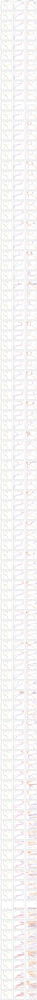

In [27]:
fig, axs = SixSignalChartSequence(df, xrng, 3, 100, 15)

In [ ]:
# fig
homedir = os.getenv("HOME") 
fig.savefig(homedir + "/ascent_descent_comparison_100.png")

<BR>
<img src="../ascent_descent_comparison_100.png" style="float: left;" alt="test charts" width="900"/>
<div style="clear: left"><BR>


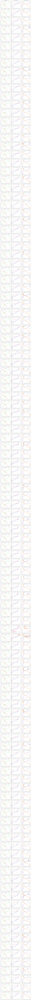

In [7]:
# Three arguments are start, number, step. 9 x 31 = 279
# As a result of saying 279 we get the month of January or more if there were skipped profiles but max so
#   far without breaking matplotlib is 120.
#   (Skipped means they did not register in the profile calculating algorithm; see earlier notebook 01 D)
fig, axs = SixSignalChartSequence(df, xrng, 0, 120, 1)

In [8]:
homedir = os.getenv("HOME") 
fig.savefig(homedir + "/axb_SP_a_d_compare_2018_0_120_1.png")

In [53]:
def HowManyProfiles(t0, t1, df):
    nTotal = 0
    nMidn = 0
    nNoon = 0
    nNinePerDay = 0
    
    # timedelta64 windows for "long" profile starts at midnight and noon
    tmidn_lower = td64(    7*60, 'm')
    tmidn_upper = td64( 8*60+20, 'm')
    tnoon_lower = td64(20*60+20, 'm')
    tnoon_upper = td64(21*60+40, 'm')

    for i in range(len(df)):
        if df["ascent_start"][i] >= t0 and df["ascent_start"][i] <= t1:
            nTotal += 1
            
            if df["descent_end"][i] - df["descent_start"][i] >= td64(60, 'm'):
                
                tProf = df["ascent_start"][i]
                day_time = tProf - dt64(tProf.date())

                if   day_time > tmidn_lower and day_time < tmidn_upper: nMidn += 1
                elif day_time > tnoon_lower and day_time < tnoon_upper: nNoon += 1
                else: print("found a long descent that did not fit noon or midnight...")
        
    return nTotal, nMidn, nNoon

t0, t1 = dt64('2018-01-01'), dt64('2018-02-01')
nDays = (t1 - t0).astype(int)
print(nDays, 'days so up to', nDays*9, 'profiles')
nTotal, nMidn, nNoon = HowManyProfiles(t0, t1, df)
print(nTotal, 'profiles with', nMidn, '/', nNoon, 'midnight / noon respectively')

31 days so up to 279 profiles
262 profiles with 27 30 midnight/noon respectively


In [ ]:
from sys import exit
print('a')
exit(1)
print('b')